In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [2]:
import networkx as nx
import numpy as np
import pandas as pd
import statistics
import pickle
import os
import itertools

import sys
sys.path.append('../..')

from networkentropy import network_energy as ne
from tqdm.auto import tqdm
from collections import namedtuple, UserDict
from functools import lru_cache
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import ParameterGrid
from copy import deepcopy

tqdm.monitor_interval = 0

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

import sys
sys.path.append("../..")
from networkentropy import network_energy as ne, network_energy_gradient as neg, network_utils as nu, utils

tqdm.pandas()

In [3]:
def initial_allocation(g, budget, allocations, copy=True):
    '''
    Performs an initial allocation of a given budget of a resource to all vertices of a given network, using provided allocation schemes
    
    Args:
        g: graph to be annotated
        budget: summary budget of allocation
        allocations: dict of allocation schemes
        copy: specifies if the graph g should be copied before modifitations
        
    Returns:
        graph g with node attributes representing allocations
    '''
    
    if copy:
        g = g.copy()

    for name, method in allocations.items():
        initial_values = method(g)
        if initial_values:
            nx.set_node_attributes(g, utils.normalize_dict(initial_values, target=budget), name)

    return g

In [4]:
# definition of a single iteration where each vertex sends resources to a randomly chosen neighbor

def do_turn(graph, allocations):
    '''
    Performs a single iteration of resource exchange
    
    Args:
        graph: input graph
        allocations: list of names of attributes which hold the initial allocation
    '''
    jump_ratio = [1/i**2 for i in range(1,6)]
    jump_prob = [jr/sum(jump_ratio) for jr in jump_ratio]

    radius = np.random.choice(range(1,6), p=jump_prob )

    for node in graph.nodes:
        neighbors = list(set(nx.ego_graph(graph, node, radius=radius).nodes()).difference([node]))
        
        if len(neighbors) > 0:
            # select a neighbor to trade resources with
            neighbor = np.random.choice(neighbors)

            # select amount to trade
            amount = 0.001

            for allocation in allocations:

                if allocation in graph.nodes[node].keys():
                    if graph.nodes[node][allocation] > amount:
                        graph.nodes[node][allocation] -= amount
                        graph.nodes[neighbor][allocation] += amount
                
    return

In [5]:
IterationEntry = namedtuple('IterationEntry', ['network','iteration','allocation','inequality_level', 'gini', 'theil'])

def run_network(g, budget, allocations, num_iterations):
    '''
    Creates initial allocation and simulates the flow of resources within the network
    
    Args:
        g: input graph
        budget: initial amount of resource to be distributed
        allocations: list of names of attributes which hold the initial allocation
        num_iterations: number of iterations of resource exchange
        
    '''
    
    # helper function which computes the sum of resource allocation
    # for a given vertex' egocentric network
    def sum_ego_graph_resource(g, node, resource, radius):
        return sum([g.nodes[n][resource] for n in nx.ego_graph(g, node, radius=radius).nodes])
    
    graph_name = g.graph['name']
    result = []
    
    # select the greatest connected component of a network
    g = nu.get_largest_connected_component(g)
    
    g = initial_allocation(g, budget=budget, allocations=allocations)
    
    for i in tqdm(range(num_iterations)):
        do_turn(g, allocations)

        for allocation in allocations:

            vertex_resource_distribution = np.array(list(nx.get_node_attributes(g, allocation).values()))
            egonet_resource_distribution = np.array([sum_ego_graph_resource(g, n, allocation, 1) for n in g.nodes])

            result.append(IterationEntry(graph_name, i, allocation, 'vertex_distribution', utils.gini(vertex_resource_distribution), utils.theil(vertex_resource_distribution)))
            result.append(IterationEntry(graph_name, i, allocation, 'egonet_distribution', utils.gini(egonet_resource_distribution), utils.theil(egonet_resource_distribution)))

    return result

In [6]:
def draw_inequality(df, inequality_level, y, title, last_num=None):
    allocations = df['allocation'].unique()
    distribution_idx = df['inequality_level'] == inequality_level
    if last_num is None:
        data_df =  df[distribution_idx]
    else:
        effective_last_num = last_num * allocations.size
        data_df = df[distribution_idx][-effective_last_num:]
    sns.lineplot(data=data_df, x='iteration', y=y, hue='allocation', hue_order=list(allocations), 
                 palette=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00','#ffff33','#a65628','#f781bf','#999999'])
    plt.title(title)
    plt.show()

def draw_vertex_inequality(df, y):
    # gini inequality for vertex inequality
    draw_inequality(df, 'vertex_distribution', y, 'gini inequality for vertex inequality')

def draw_vertex_inequality_last(df, y, last_n):
    draw_inequality(df, 'vertex_distribution', y, 'gini inequality for vertex inequality', last_num=last_n)

def draw_egonet_inequality(df, y):
    # gini inequality for egocentric networks
    draw_inequality(df, 'egonet_distribution', y, 'gini inequality for egocentric networks')

def draw_egonet_inequality_last(df, y, last_n):
    draw_inequality(df, 'egonet_distribution', y, 'gini inequality for egocentric networks', last_num=last_n)

def draw_inequalities(df, last_n=20):
    df.sort_values('iteration', inplace=True)
    draw_vertex_inequality(df, 'gini')
    draw_vertex_inequality_last(df, 'gini', last_n)
    draw_egonet_inequality(df, 'gini')
    draw_egonet_inequality_last(df, 'gini', last_n)

In [7]:
# helper method for drawing networks

def draw_graph(g, node_decorator, title_postfix='', size_factor=1e4):
    values = node_decorator(g).values()
    options = { 
        'node_color': [d for d in list(values)],
        'node_size': [d * size_factor for d in list(values)],
        'cmap': plt.cm.Oranges,
        'edge_color': 'gray',
    }
    plt.figure(figsize=(10, 6))
    plt.title(g.graph['name'] + title_postfix)
    nx.draw(g, **options)
    plt.show()

In [8]:
def templates_to_netwok_dict(nets_gens_templates):
    def make_gen(generator, ps):
        return lambda: generator(**ps)
    result = {}
    for name, (generator, params) in tqdm(list(nets_gens_templates.items())):
        for i, params_row in enumerate(params):
            result[f'{name} {params_row}'] = make_gen(generator, params_row)
    return NetworksDict(result)

In [9]:
# Definision of helper methods for creating networks

class NetworksDict(UserDict):
    '''
    Intercepts __setitem__ method to assign dict key as graph name
    '''
    def __setitem__(self, name, method):
        def wrapper(*args):
            result = method(*args)
            result.graph['name'] = name
            return result
        super(NetworksDict, self).__setitem__(name, wrapper)

In [10]:
# Constants definisions
N = 300
P_ERDOS_RENYI = 0.025
P_HOLME_KIM = 0.1
M_HOLME_KIM = 2
K_K_OUT = 3
K_ALPHA = 1
K_WATTS = 4

In [11]:
def sums_helper(length,total_sum, max_sum):
    if length < 1:
        raise ValueError("Length must be positive")
    if length == 1:
        yield (total_sum/max_sum,)
    else:
        for value in range(1, total_sum):
            for permutation in sums_helper(length - 1,total_sum - value, max_sum):
                yield (value/max_sum,) + permutation
                
def sums(length,total_sum):
    return sums_helper(length, total_sum, total_sum)

In [12]:
ABG = list(sums(3, 5))
P_PARAMS = ParameterGrid({'p': np.linspace(0.05, 0.3, 3)})
ERDOS_PARAMS = ParameterGrid({'p': np.linspace(0.01, 0.05, 3)})
HOLME_KIM_PARAMS = ParameterGrid({'p': np.linspace(0.05, 0.3, 3), 'm': [2, 4]})
K_OUT_PARAMS = ParameterGrid({'p': range(1, 4), 'k': [2, 4]})
PARAMS_A_B_G = [{'a': a, 'b': b, 'g': g} for a, b, g in ABG]

In [13]:
Gen = namedtuple('Gen', ['generator', 'params'])
NETWORKS_GENERATORS_TEMPLATES = {
    'erdos-renyi': Gen(lambda p: nx.erdos_renyi_graph(n=N, p=p), ERDOS_PARAMS),
    'holme-kim': Gen(lambda p, m: nx.powerlaw_cluster_graph(n=N, m=m, p=p), HOLME_KIM_PARAMS),
    'watts-strogatz': Gen(lambda p: nx.watts_strogatz_graph(n=N, k=K_WATTS, p=p), P_PARAMS),
    'waxman': Gen(lambda p: nx.waxman_graph(n=N, alpha=0.5 + p/2, beta=0.1), P_PARAMS),
    'erdos-renyi-directed': Gen(lambda p: nx.erdos_renyi_graph(n=N, p=p, directed=True), ERDOS_PARAMS),
    'k-out': Gen(lambda p, k: nx.DiGraph(nx.random_k_out_graph(n=N, k=3, alpha=p, self_loops=False)), K_OUT_PARAMS),
    'scale-free': Gen(lambda a, b, g: nx.DiGraph(nx.scale_free_graph(alpha=a, beta=b, gamma=g, n=N)), PARAMS_A_B_G),
}

DI_NETWORKS_GENERATORS_TEMPLATES = {
}

In [14]:
NETWORKS_GENERATORS = templates_to_netwok_dict(NETWORKS_GENERATORS_TEMPLATES)

In [15]:
list(NETWORKS_GENERATORS.keys())

["erdos-renyi {'p': 0.01}",
 "erdos-renyi {'p': 0.03}",
 "erdos-renyi {'p': 0.05}",
 "holme-kim {'m': 2, 'p': 0.05}",
 "holme-kim {'m': 2, 'p': 0.175}",
 "holme-kim {'m': 2, 'p': 0.3}",
 "holme-kim {'m': 4, 'p': 0.05}",
 "holme-kim {'m': 4, 'p': 0.175}",
 "holme-kim {'m': 4, 'p': 0.3}",
 "watts-strogatz {'p': 0.05}",
 "watts-strogatz {'p': 0.175}",
 "watts-strogatz {'p': 0.3}",
 "waxman {'p': 0.05}",
 "waxman {'p': 0.175}",
 "waxman {'p': 0.3}",
 "erdos-renyi-directed {'p': 0.01}",
 "erdos-renyi-directed {'p': 0.03}",
 "erdos-renyi-directed {'p': 0.05}",
 "k-out {'k': 2, 'p': 1}",
 "k-out {'k': 2, 'p': 2}",
 "k-out {'k': 2, 'p': 3}",
 "k-out {'k': 4, 'p': 1}",
 "k-out {'k': 4, 'p': 2}",
 "k-out {'k': 4, 'p': 3}",
 "scale-free {'a': 0.2, 'b': 0.2, 'g': 0.6}",
 "scale-free {'a': 0.2, 'b': 0.4, 'g': 0.4}",
 "scale-free {'a': 0.2, 'b': 0.6, 'g': 0.2}",
 "scale-free {'a': 0.4, 'b': 0.2, 'g': 0.4}",
 "scale-free {'a': 0.4, 'b': 0.4, 'g': 0.2}",
 "scale-free {'a': 0.6, 'b': 0.2, 'g': 0.2}"]

In [16]:
ALLOCATIONS = {
    'random': lambda g: { node: np.random.random() for node in g.nodes },
    'constant': lambda g: { node:1 for node in g.nodes },
    'pagerank': nx.pagerank,
    
    'randic': ne.randic_centrality,
    'laplace': ne.directed_laplacian_centrality,
    'graph': ne.graph_energy_centrality,
    
    'randic_gradnient_relu': lambda g: neg.get_energy_gradient_centrality(g, method='randic', activation='relu'),
    'laplace_gradient_relu': lambda g: neg.get_energy_gradient_centrality(g, method='directed_laplacian', activation='relu'),
    'graph_gradnient_relu': lambda g: neg.get_energy_gradient_centrality(g, method='graph', activation='relu'),
    
    'randic_gradient_elu': lambda g: neg.get_energy_gradient_centrality(g, method='randic', activation='relu'),
    'laplace_gradient_elu': lambda g: neg.get_energy_gradient_centrality(g, method='directed_laplacian', activation='relu'),
    'graph_gradnient_elu': lambda g: neg.get_energy_gradient_centrality(g, method='graph', activation='relu'),
    
    'randic_gradnient_relu_personalized': lambda g: neg.get_energy_gradient_centrality(g, method='randic', activation='relu', personalization=ne.randic_centrality(g)),
    'laplace_gradient_relu_personalized': lambda g: neg.get_energy_gradient_centrality(g, method='directed_laplacian', activation='relu', personalization=ne.directed_laplacian_centrality(g)),
    'graph_gradnient_relu_personalized': lambda g: neg.get_energy_gradient_centrality(g, method='graph', activation='relu', personalization=ne.graph_energy_centrality(g)),
    
    'randic_gradnient_elu_personalized': lambda g: neg.get_energy_gradient_centrality(g, method='randic', activation='elu', personalization=ne.randic_centrality(g)),
    'laplace_gradient_elu_personalized': lambda g: neg.get_energy_gradient_centrality(g, method='directed_laplacian', activation='elu', personalization=ne.directed_laplacian_centrality(g)),
    'graph_gradnient_elu_personalized': lambda g: neg.get_energy_gradient_centrality(g, method='graph', activation='elu', personalization=ne.graph_energy_centrality(g)),
    
    'randic_pagerank': lambda g: nx.pagerank(g, personalization=ne.randic_centrality(g)),
    'laplace_pagerank': lambda g: nx.pagerank(g, personalization=ne.directed_laplacian_centrality(g)),
    'graph_pagerank': lambda g: nx.pagerank(g, personalization=ne.graph_energy_centrality(g)),
}

In [27]:
BUDGET = 1
NUM_ITERS = 500
N_REPEATS = 4

In [18]:
synthetic_dfs = []

#### Lading data

In [19]:
RESULTS_PATH = "energy-gradient-allocation/"
if not os.path.exists(RESULTS_PATH):
    os.mkdir(RESULTS_PATH)

In [20]:
def iteration_entry_to_dict(entry, additional_dict):
    d = entry._asdict()
    d.update(additional_dict)
    return d

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


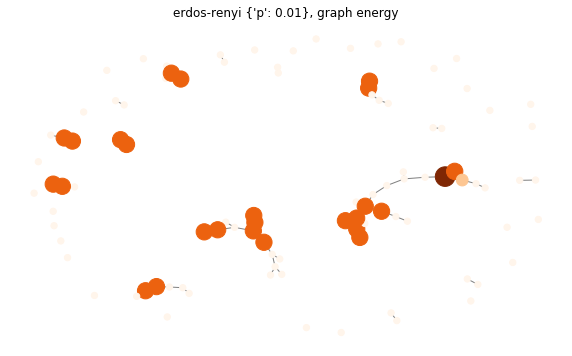

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


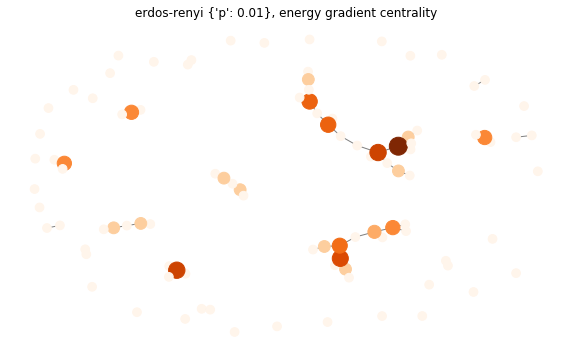

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


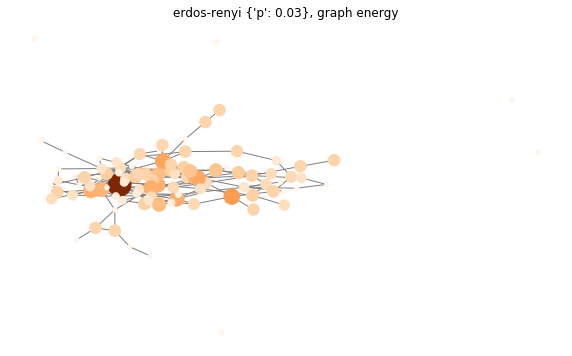

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


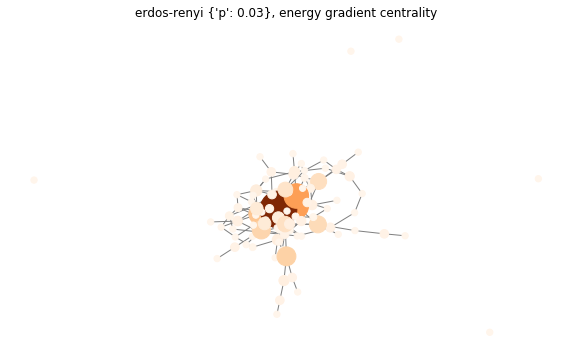

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


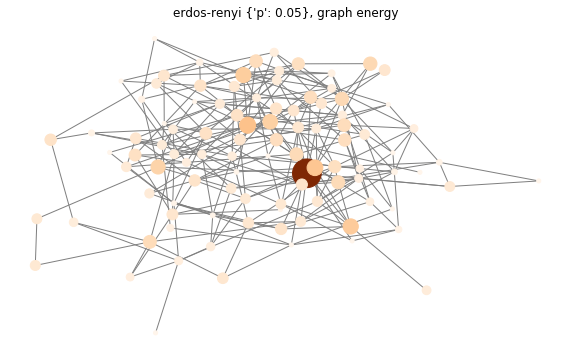

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


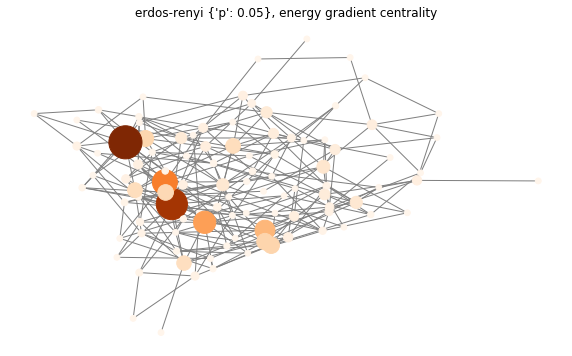

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


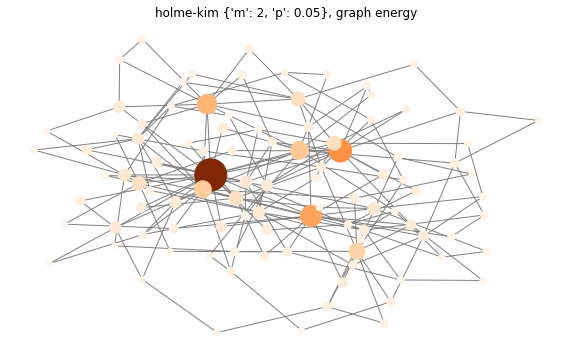

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


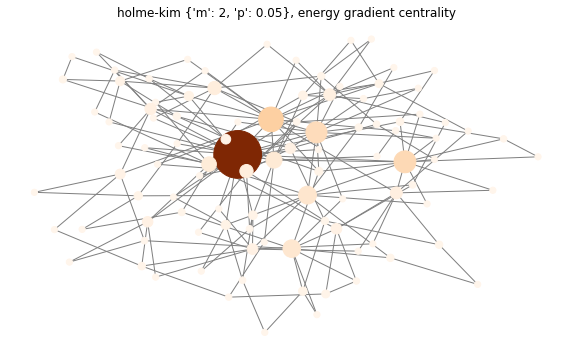

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


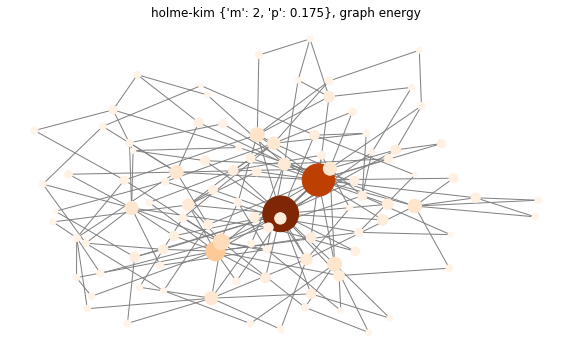

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


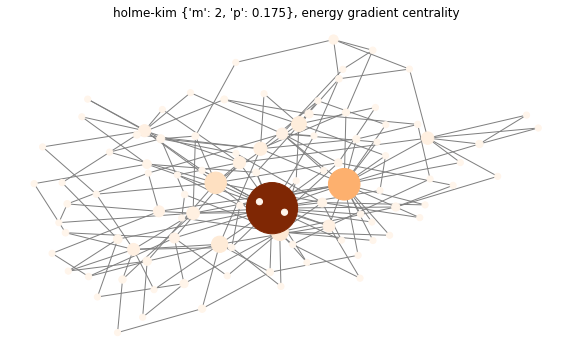

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


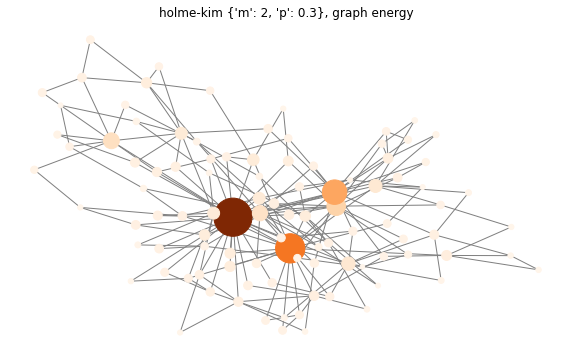

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


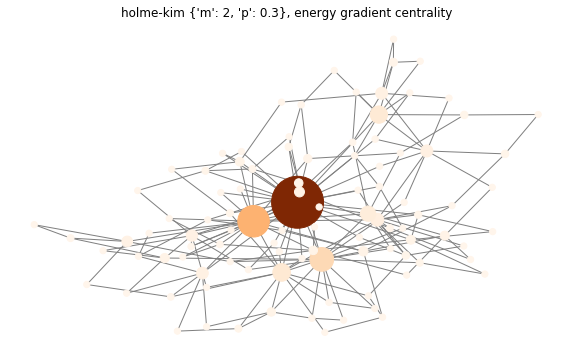

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


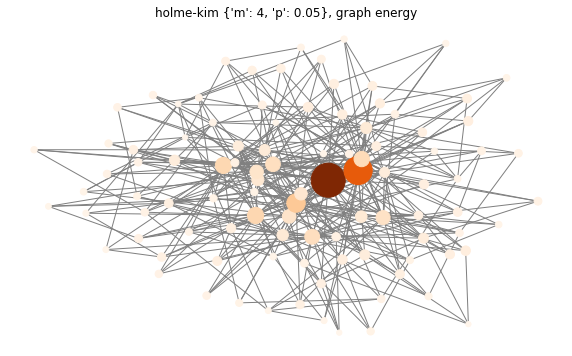

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


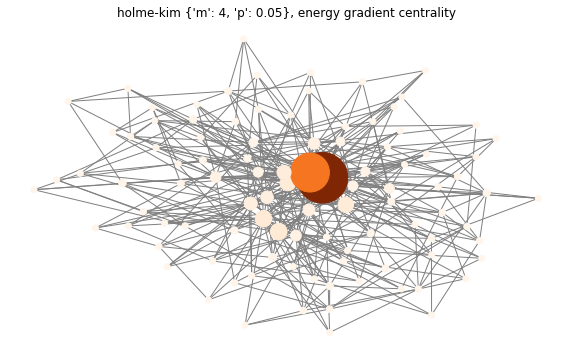

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


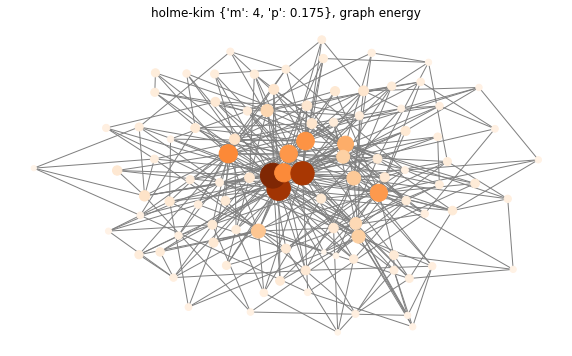

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


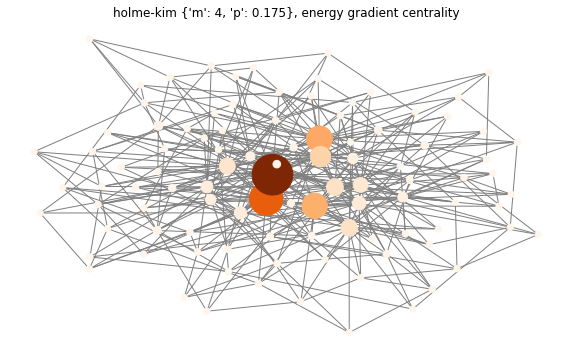

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


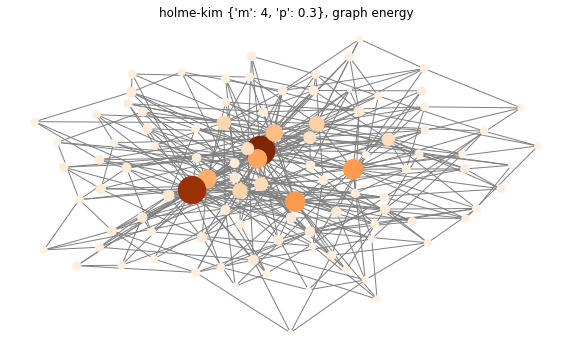

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


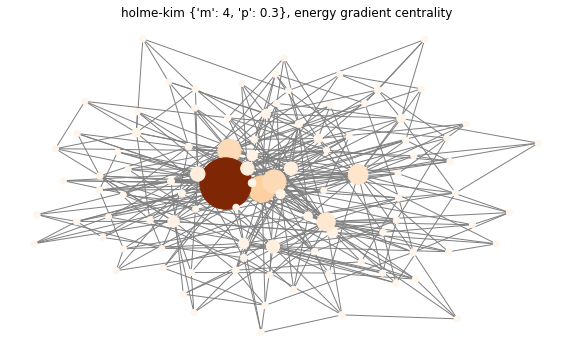

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


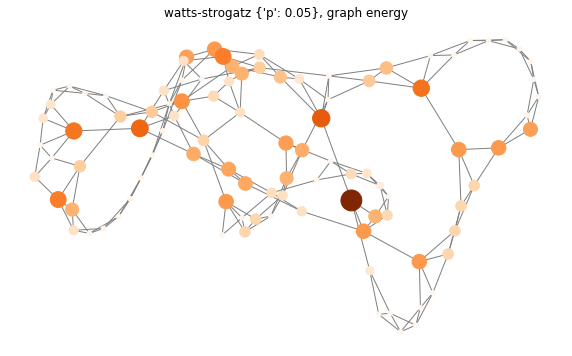

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


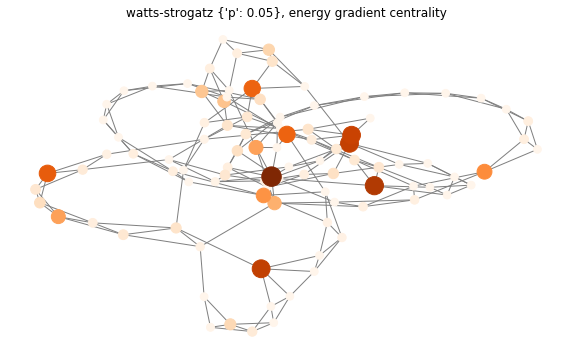

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


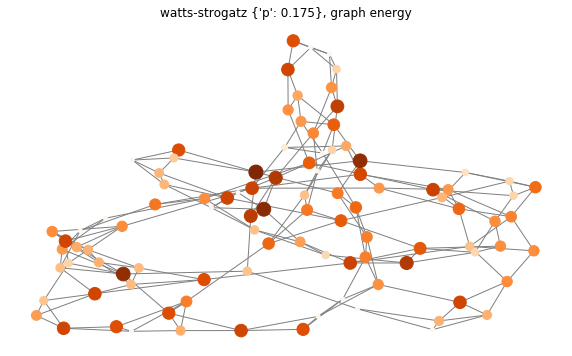

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


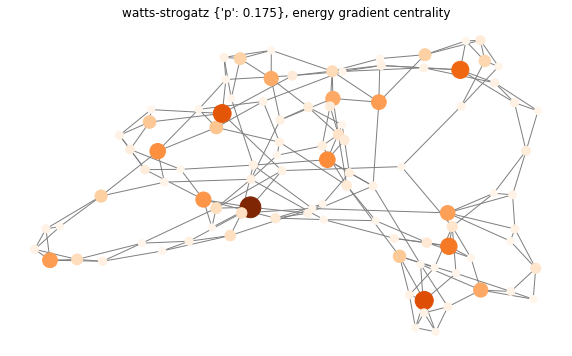

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


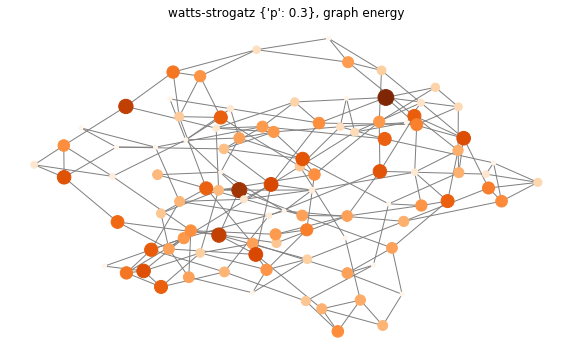

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


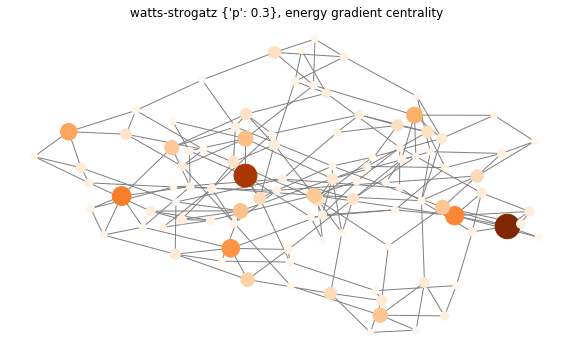

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


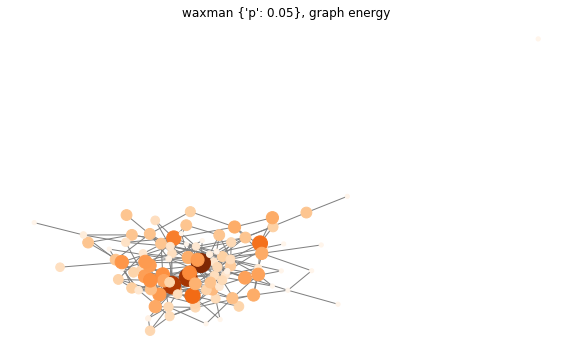

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


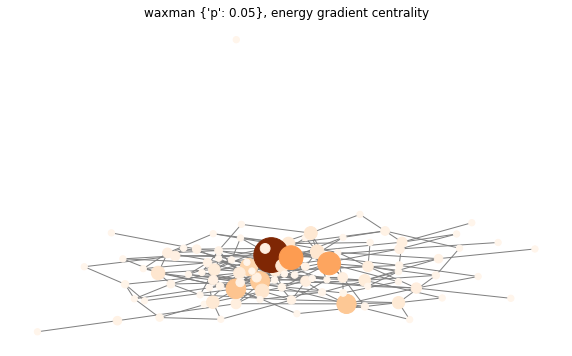

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


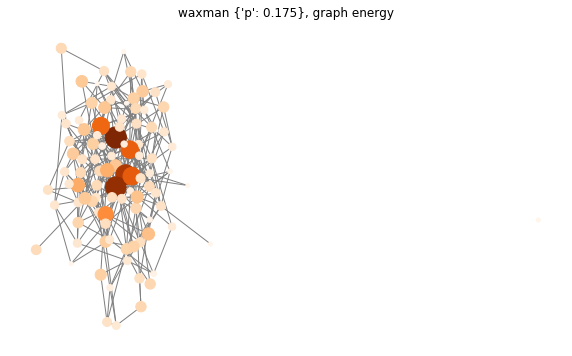

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


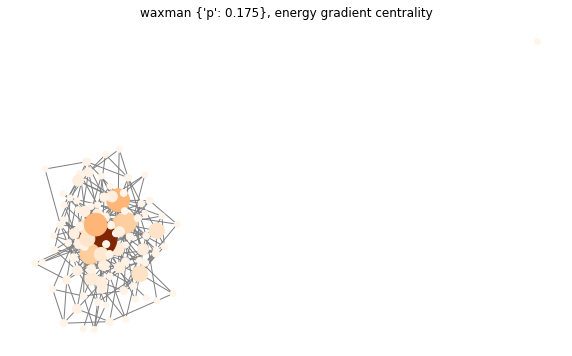

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


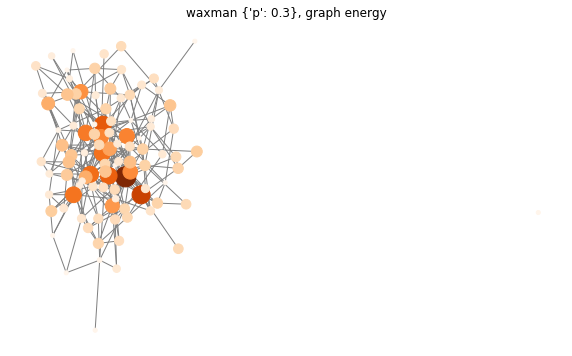

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


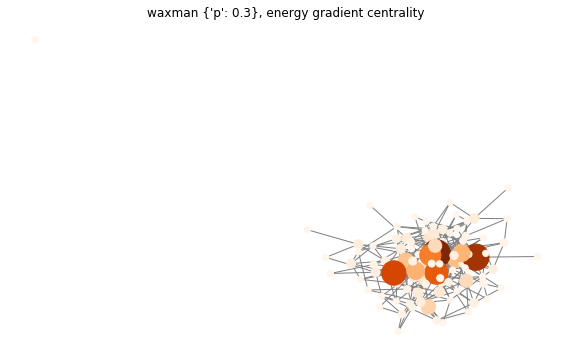

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cb.iterable(node_size):  # many node sizes


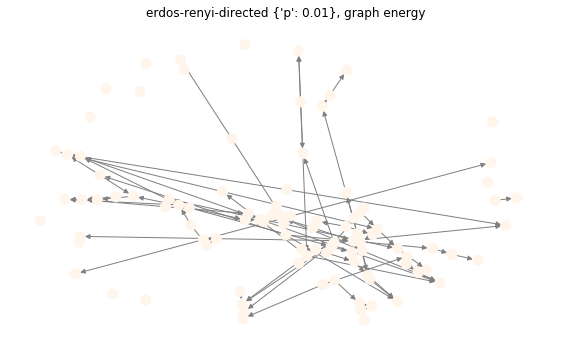

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cb.iterable(node_size):  # many node sizes


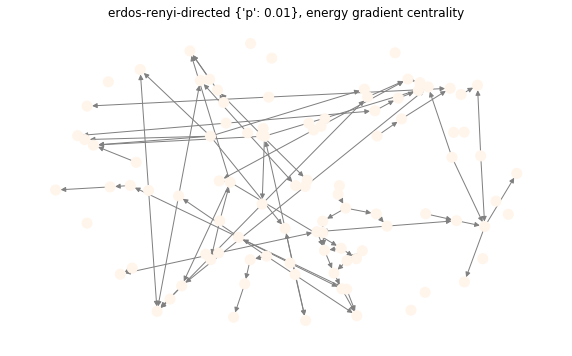

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\algorithms\link_analysis\pagerank_alg.py:133: RuntimeWarning: invalid value encountered in double_scalars
  p = dict((k, v / s) for k, v in personalization.items())


WARN: PowerIterationFailedConvergence


C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\algorithms\link_analysis\pagerank_alg.py:133: RuntimeWarning: invalid value encountered in double_scalars
  p = dict((k, v / s) for k, v in personalization.items())


WARN: PowerIterationFailedConvergence
WARN: PowerIterationFailedConvergence


C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\networkx\algorithms\link_analysis\pagerank_alg.py:133: RuntimeWarning: invalid value encountered in double_scalars
  p = dict((k, v / s) for k, v in personalization.items())


WARN: PowerIterationFailedConvergence



PowerIterationFailedConvergence: (PowerIterationFailedConvergence(...), 'power iteration failed to converge within 100 iterations')

In [95]:
for network_name, network_creator in tqdm(list(NETWORKS_GENERATORS.items())):
    display(HTML(f'<h2>{network_name}</h2>'))
    g = network_creator()
    draw_graph(g, lambda g: utils.normalize_dict(ne.gradient_centrality(g)), title_postfix=', graph energy')
    draw_graph(g, lambda g: utils.normalize_dict(neg.get_energy_gradient_centrality(g, method='graph', activation='relu')), title_postfix=', energy gradient centrality')
    
    dfs = []
    for repeat_no in tqdm(list(range(N_REPEATS))):
        g = network_creator()
        results = run_network(g, BUDGET, ALLOCATIONS, NUM_ITERS)
        df = pd.DataFrame(list(map(lambda e: iteration_entry_to_dict(e, {'repeat_no': repeat_no}), results)))
        dfs.append(df)
    synthetic_dfs.append(dfs)

In [ ]:
x

#### Saving data

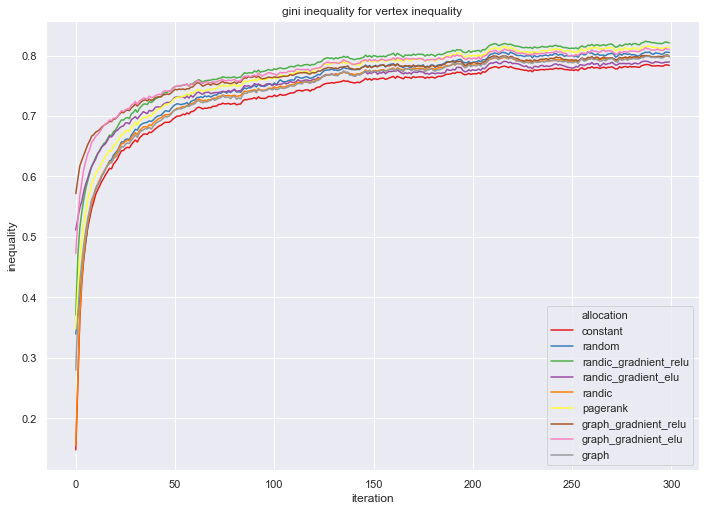

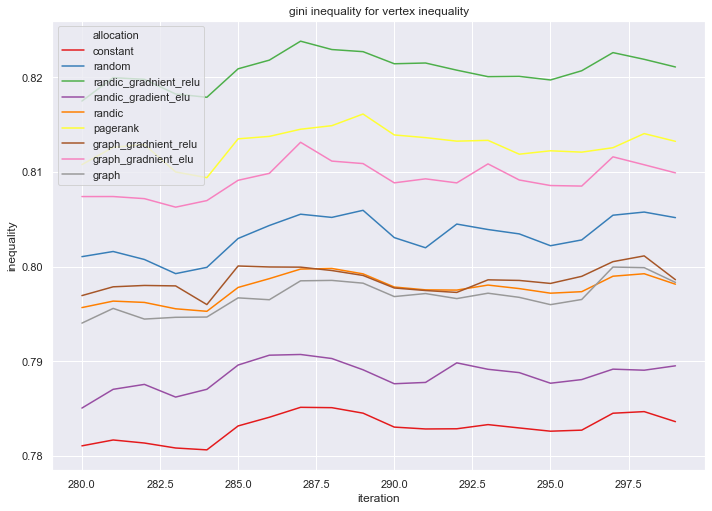

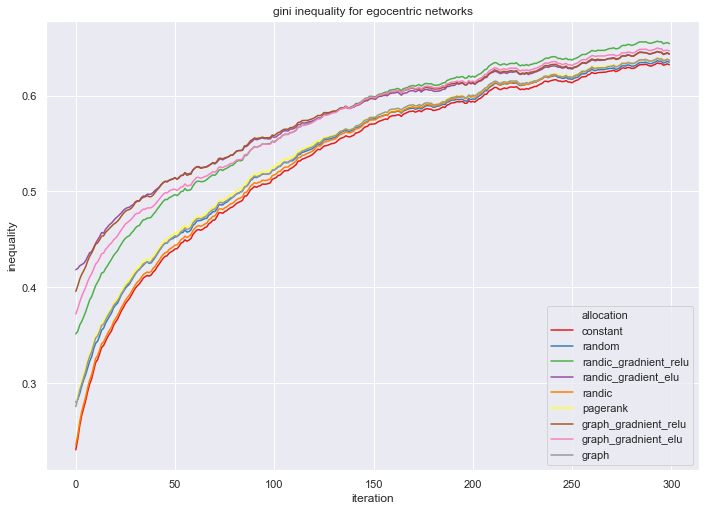

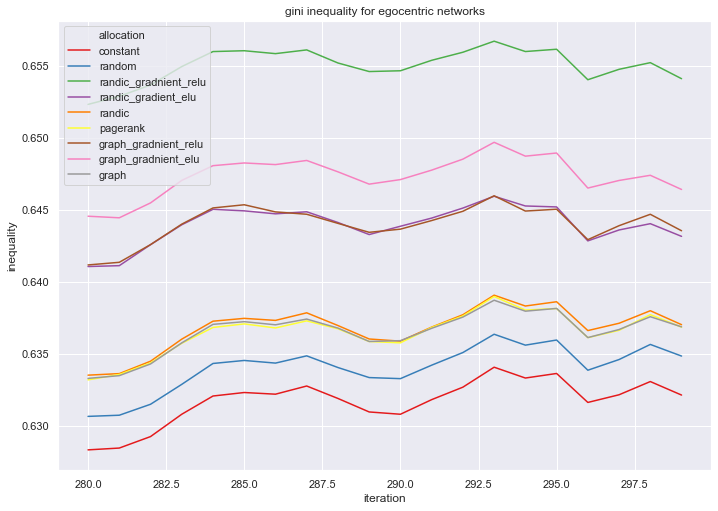

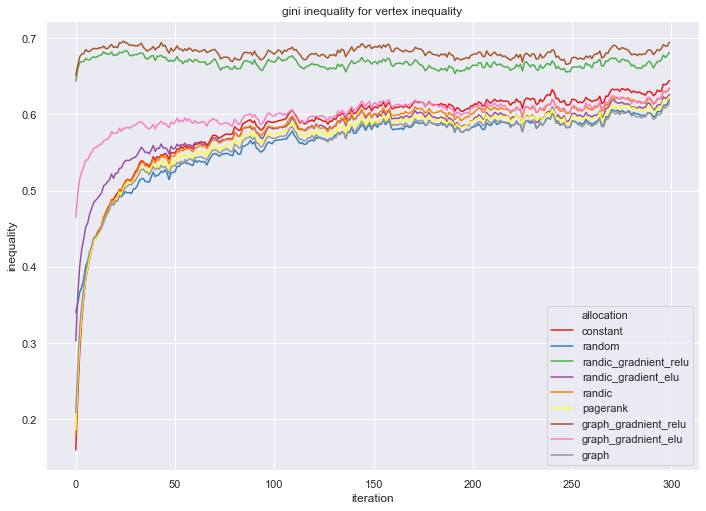

...

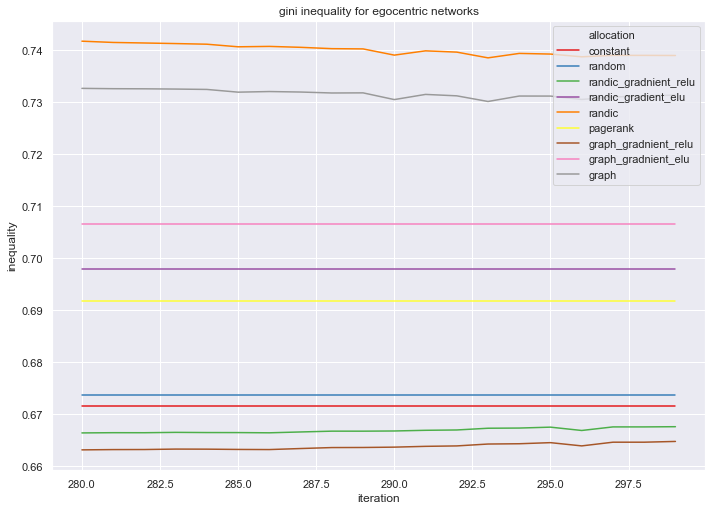

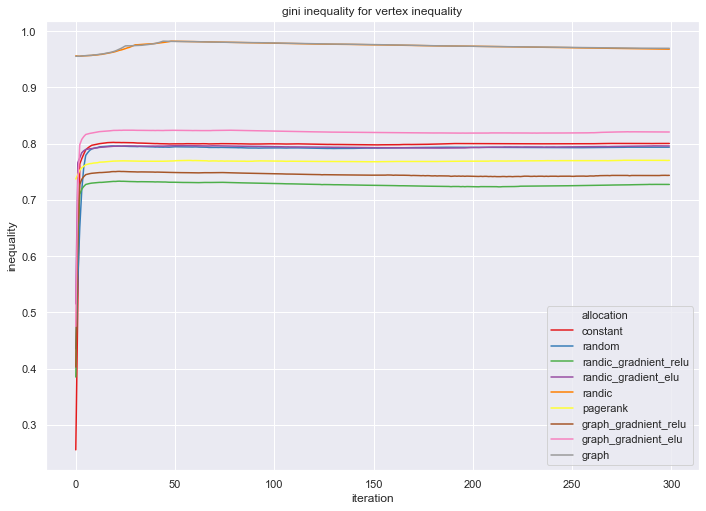

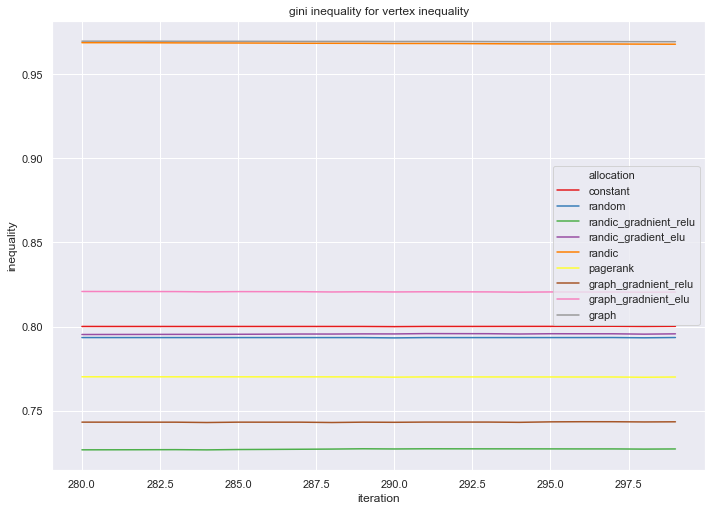

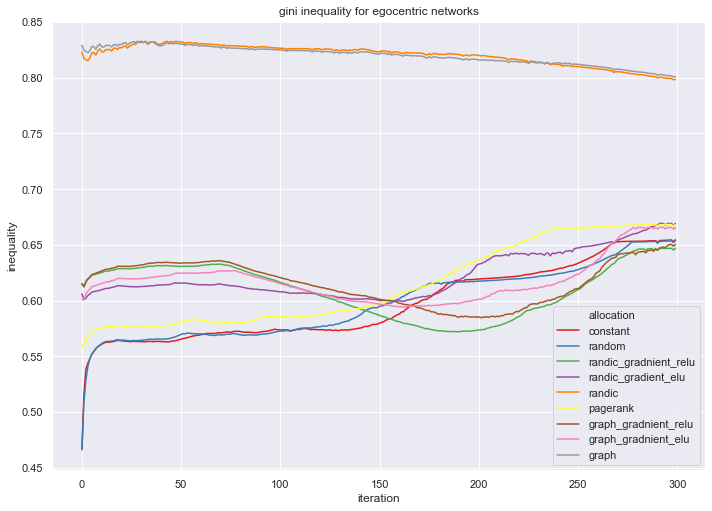

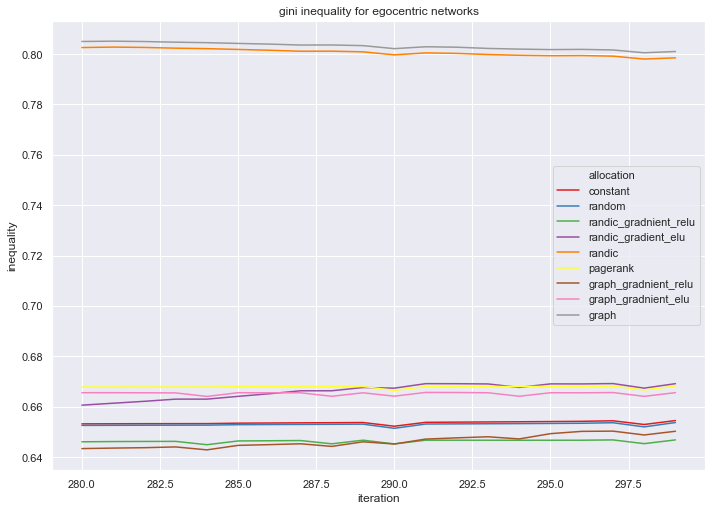

In [55]:
for dfs in synthetic_dfs:
    df = pd.concat(dfs)
    df = df.query("allocation not in ['randic_pagerank', 'graph_pagerank', 'randic_gradnient_personalized', 'graph_gradnient_personalized']")
    avg_df = df.groupby(list(set(df.columns).difference(['repeat_no','inequality']))).mean()
    avg_df.reset_index(inplace=True)
    sns.set()
    sns.set(rc={'figure.figsize':(11.7,8.27)})    
    draw_inequalities(avg_df)

In [14]:
%%time
results = []
for i in range(100):
    results.append(theil(np.array(list(utils.normalize_dict({e: e for e in range(1000)}).values()))))

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: divide by zero encountered in log
C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in multiply


Wall time: 59 ms


In [15]:
%%time
results2 = []
for i in range(100):
    results2.append(utils.theil(np.array(list(utils.normalize_dict({e: e for e in range(1000)}).values()))))

Wall time: 185 ms


In [95]:
synthetic_df = pd.concat(itertools.chain.from_iterable(synthetic_dfs))

In [96]:
synthetic_avg_df = synthetic_df.groupby(list(set(synthetic_df.columns).difference(['repeat_no', 'inequality']))).mean()
synthetic_avg_df.reset_index(inplace=True)

In [130]:
np.nansum(4 * np.log(0))

C:\Users\Tomi\Anaconda3\envs\entropy\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log
  """Entry point for launching an IPython kernel.


-inf

In [31]:
def get_min_inequlity_method(df, dist):
    idx = df\
    .query("iteration == (@NUM_ITERS - 1) and inequality_level == @dist")\
    .groupby('network')['inequality'].idxmin()
    return df.loc[idx]

In [50]:
def calculate_avg_rate_of_change_and_variance(df):
    result = {
        'avg_roc': [(df.loc[df['iteration'] == NUM_ITERS-1].iloc[0]['inequality'] - df.loc[df['iteration'] == 0].iloc[0]['inequality'])/NUM_ITERS],
        'variance': [statistics.pvariance(df['inequality'])],
    } 
    return pd.DataFrame(result)

def group_and_calculate_avg_roc_and_variance(df):
    return df.groupby(['network', 'allocation', 'inequality_level'])\
.apply(calculate_avg_rate_of_change_and_variance)

In [51]:
def get_min_statistic_method(df, statistic, dist):
    idx = df.query("inequality_level == @dist").groupby('network')[statistic].idxmin()
    return df.loc[idx, statistic].to_frame()

In [34]:
get_min_inequlity_method(synthetic_avg_df, 'vertex_distribution')

NameError: name 'synthetic_avg_df' is not defined

In [101]:
get_min_inequlity_method(synthetic_avg_df, 'egonet_distribution')

,inequality_level,allocation,network,iteration,inequality,repeat_no
299,egonet_distribution,constant,erdos-renyi {'p': 0.01},299,0.678088,1.5
108599,egonet_distribution,random,erdos-renyi {'p': 0.155},299,0.142488,1.5
108899,egonet_distribution,random,erdos-renyi {'p': 0.3},299,0.077109,1.5
64199,egonet_distribution,randic,erdos-renyi-directed {'p': 0.01},299,0.676373,1.5
73499,egonet_distribution,randic_gradient_elu,erdos-renyi-directed {'p': 0.155},299,0.131579,1.5
73799,egonet_distribution,randic_gradient_elu,erdos-renyi-directed {'p': 0.3},299,0.080340,1.5
110099,egonet_distribution,random,"holme-kim {'m': 2, 'p': 0.05}",299,0.686627,1.5
65399,egonet_distribution,randic,"holme-kim {'m': 2, 'p': 0.175}",299,0.650092,1.5
92699,egonet_distribution,randic_gradnient_relu,"holme-kim {'m': 2, 'p': 0.3}",299,0.678905,1.5
38999,egonet_distribution,graph_gradnient_relu,"holme-kim {'m': 4, 'p': 0.05}",299,0.584821,1.5


In [102]:
synthetic_avg_roc_and_variance_df = group_and_calculate_avg_roc_and_variance(synthetic_avg_df)

In [103]:
get_min_statistic_method(synthetic_avg_roc_and_variance_df, 'avg_roc', 'vertex_distribution')

,,,,avg_roc
network,allocation,inequality_level,,
erdos-renyi {'p': 0.01},randic_gradnient_personalized,vertex_distribution,0,0.000797
erdos-renyi {'p': 0.155},randic_gradnient_relu,vertex_distribution,0,0.000813
erdos-renyi {'p': 0.3},random,vertex_distribution,0,0.000612
erdos-renyi-directed {'p': 0.01},randic_gradnient_personalized,vertex_distribution,0,-0.000865
erdos-renyi-directed {'p': 0.155},graph_gradnient_personalized,vertex_distribution,0,-0.000136
erdos-renyi-directed {'p': 0.3},graph_gradnient_personalized,vertex_distribution,0,-0.000253
"holme-kim {'m': 2, 'p': 0.05}",graph_gradnient_personalized,vertex_distribution,0,0.000456
"holme-kim {'m': 2, 'p': 0.175}",graph_gradnient_personalized,vertex_distribution,0,0.000489
"holme-kim {'m': 2, 'p': 0.3}",graph_gradnient_personalized,vertex_distribution,0,0.000462


In [104]:
get_min_statistic_method(synthetic_avg_roc_and_variance_df, 'avg_roc', 'egonet_distribution')

,,,,avg_roc
network,allocation,inequality_level,,
erdos-renyi {'p': 0.01},randic_gradnient_personalized,egonet_distribution,0,0.000842
erdos-renyi {'p': 0.155},graph_gradnient_personalized,egonet_distribution,0,0.000169
erdos-renyi {'p': 0.3},graph_gradnient_personalized,egonet_distribution,0,0.000070
erdos-renyi-directed {'p': 0.01},randic_gradnient_personalized,egonet_distribution,0,-0.000848
erdos-renyi-directed {'p': 0.155},graph_gradnient_personalized,egonet_distribution,0,-0.000261
erdos-renyi-directed {'p': 0.3},graph_gradnient_personalized,egonet_distribution,0,-0.000165
"holme-kim {'m': 2, 'p': 0.05}",randic_gradient_elu,egonet_distribution,0,0.000597
"holme-kim {'m': 2, 'p': 0.175}",graph_gradnient_personalized,egonet_distribution,0,0.000529
"holme-kim {'m': 2, 'p': 0.3}",graph_gradnient_personalized,egonet_distribution,0,0.000555


In [105]:
get_min_statistic_method(synthetic_avg_roc_and_variance_df, 'variance', 'vertex_distribution')

,,,,variance
network,allocation,inequality_level,,
erdos-renyi {'p': 0.01},randic_gradnient_personalized,vertex_distribution,0,0.002466
erdos-renyi {'p': 0.155},graph_gradnient_personalized,vertex_distribution,0,0.001331
erdos-renyi {'p': 0.3},graph_gradnient_personalized,vertex_distribution,0,0.000860
erdos-renyi-directed {'p': 0.01},randic_pagerank,vertex_distribution,0,0.001431
erdos-renyi-directed {'p': 0.155},randic_gradnient_relu,vertex_distribution,0,0.000042
erdos-renyi-directed {'p': 0.3},graph_gradnient_elu,vertex_distribution,0,0.000262
"holme-kim {'m': 2, 'p': 0.05}",randic_gradient_elu,vertex_distribution,0,0.000507
"holme-kim {'m': 2, 'p': 0.175}",randic_gradient_elu,vertex_distribution,0,0.000571
"holme-kim {'m': 2, 'p': 0.3}",graph_gradnient_personalized,vertex_distribution,0,0.000533


In [106]:
get_min_statistic_method(synthetic_avg_roc_and_variance_df, 'variance', 'egonet_distribution')

,,,,variance
network,allocation,inequality_level,,
erdos-renyi {'p': 0.01},randic_gradient_elu,egonet_distribution,0,4.817743e-03
erdos-renyi {'p': 0.155},graph_gradnient_personalized,egonet_distribution,0,1.270999e-04
erdos-renyi {'p': 0.3},random,egonet_distribution,0,2.224706e-05
erdos-renyi-directed {'p': 0.01},randic_pagerank,egonet_distribution,0,5.064230e-03
erdos-renyi-directed {'p': 0.155},graph_gradnient_elu,egonet_distribution,0,9.331495e-05
erdos-renyi-directed {'p': 0.3},graph_gradnient_elu,egonet_distribution,0,3.491982e-06
"holme-kim {'m': 2, 'p': 0.05}",randic_gradient_elu,egonet_distribution,0,1.639129e-03
"holme-kim {'m': 2, 'p': 0.175}",randic_gradient_elu,egonet_distribution,0,1.216407e-03
"holme-kim {'m': 2, 'p': 0.3}",randic_gradient_elu,egonet_distribution,0,1.824417e-03


In [36]:
from bs4 import BeautifulSoup
import requests
import wget
import tarfile
import shutil
import time

In [37]:
datasets = nu.create_datasets('konect.uni')

In [44]:
def calculate_density(g):
    edges_num = nx.number_of_edges(g)
    nodes_num = nx.number_of_nodes(g)
    if not g.is_directed():
        edges_num *= 2
    return edges_num/(nodes_num*(nodes_num-1))

In [35]:
filtered_datasets = datasets.filter(not_categories=['Rating'], min_size=100, max_size=2000)
empirical_networks_df = filtered_datasets.download_and_build_networks().rename(columns={'graph': 'g'})
largest_component_df = empirical_networks_df.progress_apply(lambda s: nu.get_largest_connected_component(s['g']), axis=1)
largest_component_n_df = largest_component_df.progress_apply(lambda g: nx.number_of_nodes(g))
largest_component_dens_df = largest_component_df.progress_apply(calculate_density)
print(largest_component_n_df)
empirical_networks_df = empirical_networks_df.assign(g=largest_component_df)
empirical_networks_df = empirical_networks_df.assign(real_num_nodes=largest_component_n_df)
empirical_networks_df = empirical_networks_df.assign(real_density=largest_component_dens_df)
empirical_networks_df = empirical_networks_df.query('real_num_nodes <= 2000')

NameError: name 'datasets' is not defined

In [49]:
empirical_networks_df

,name,category,directed,num_nodes,num_edges,tsv_url,g,real_num_nodes,real_density
4,maayan-faa,Infrastructure,True,1226,2615,http://konect.uni-koblenz.de/downloads/tsv/maa...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",1226,0.001741
8,brunson_revolution,Affiliation,False,141,160,http://konect.uni-koblenz.de/downloads/tsv/bru...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",136,0.017320
18,moreno_names,Lexical,False,1773,16401,http://konect.uni-koblenz.de/downloads/tsv/mor...,"(1, 2, 100, 3, 54, 4, 73, 5, 31, 6, 67, 7, 8, ...",1773,0.006700
23,moreno_blogs,Hyperlink,True,1224,19025,http://konect.uni-koblenz.de/downloads/tsv/mor...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",1222,0.012750
27,arenas-meta,Metabolic,False,453,4596,http://konect.uni-koblenz.de/downloads/tsv/are...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",453,0.019926
34,tntp-ChicagoRegional,Infrastructure,False,1467,1298,http://konect.uni-koblenz.de/downloads/tsv/tnt...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",823,0.002430
44,moreno_crime,Interaction,False,1380,1476,http://konect.uni-koblenz.de/downloads/tsv/mor...,"(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",829,0.004298
45,adjnoun_adjacency,Lexical,False,112,425,http://konect.uni-koblenz.de/downloads/tsv/adj...,"(1, 2, 3, 9, 14, 18, 19, 20, 29, 42, 46, 47, 5...",112,0.068372
75,subelj_euroroad,Infrastructure,False,1174,1417,http://konect.uni-koblenz.de/downloads/tsv/sub...,"(6, 7, 880, 8, 22, 23, 411, 453, 454, 889, 9, ...",1039,0.002420
98,petster-friendships-hamster,Social,False,1858,12534,http://konect.uni-koblenz.de/downloads/tsv/pet...,"(99, 98, 999, 550, 42, 25, 998, 996, 87, 467, ...",1788,0.007809


In [39]:
BUDGET = 1
NUM_ITERS = 300
SMALL_NETWORK_THRESHOLD = 1000

In [40]:
empirical_dfs = []

In [41]:
N_REPEATS = 1

C:\Users\tomi.wojtowicz\AppData\Local\Continuum\anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


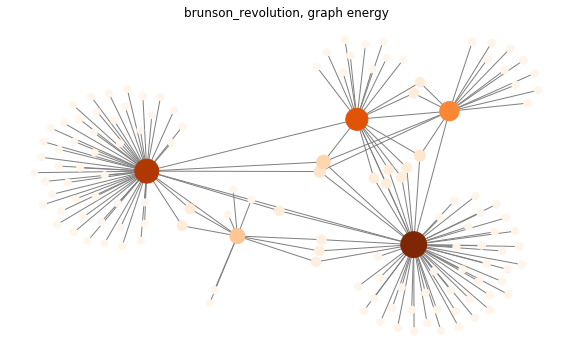

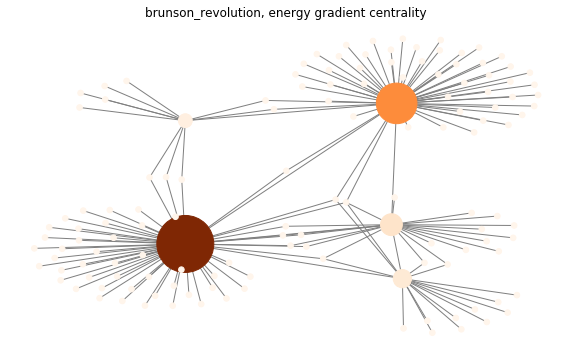

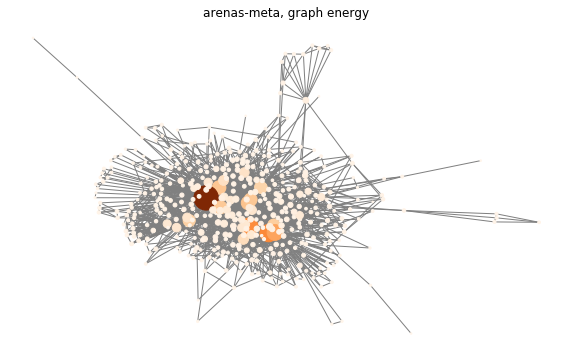

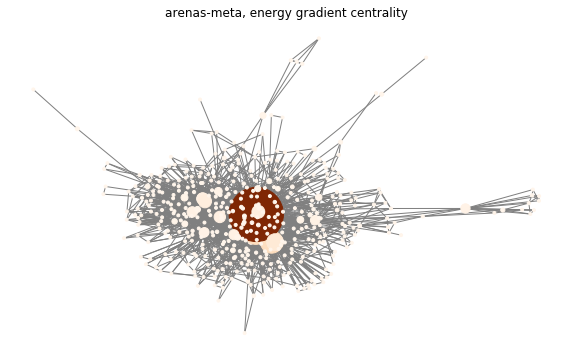

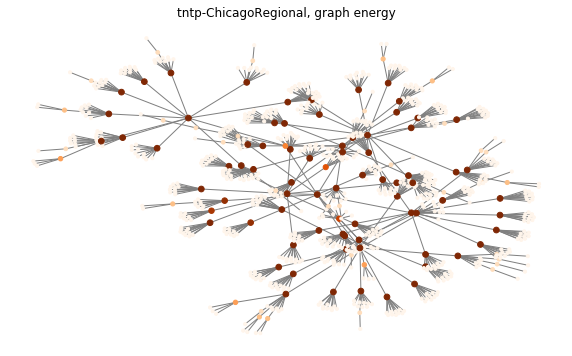

...

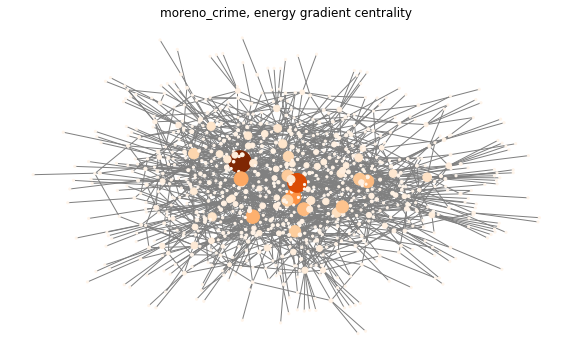

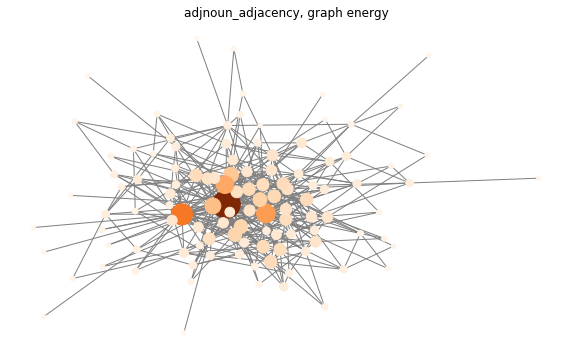

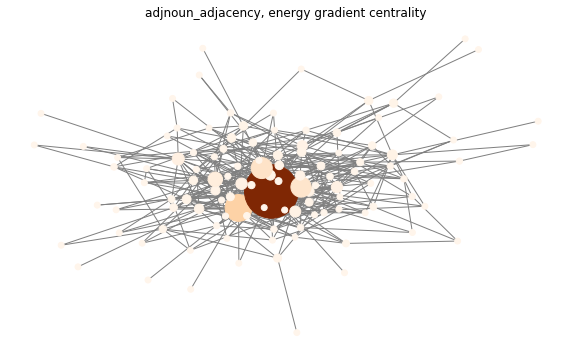

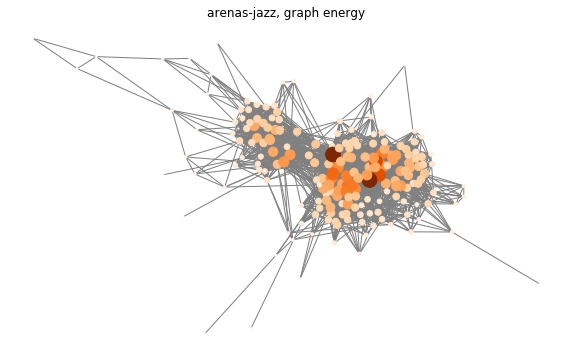

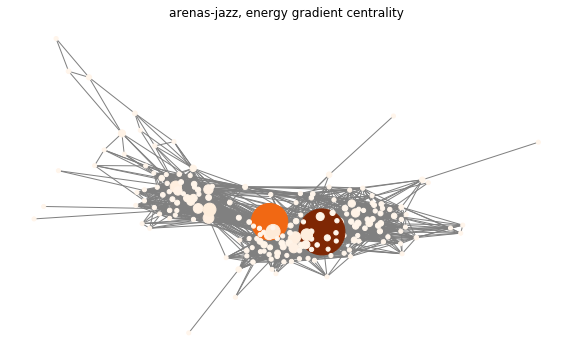

C:\Users\tomi.wojtowicz\AppData\Local\Continuum\anaconda3\envs\entropy\lib\site-packages\networkx\drawing\nx_pylab.py:676: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if cb.iterable(node_size):  # many node sizes


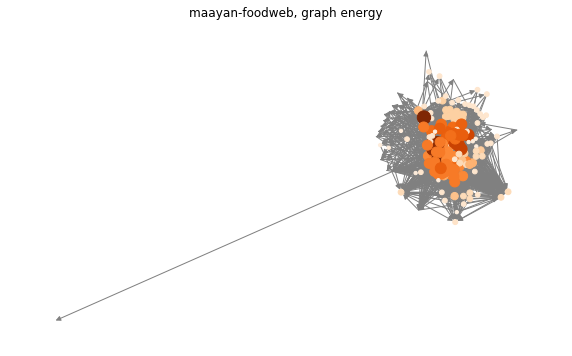

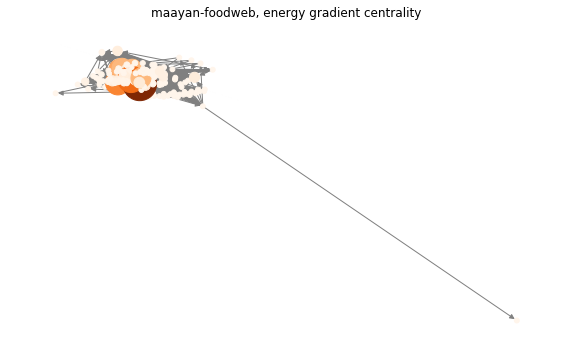

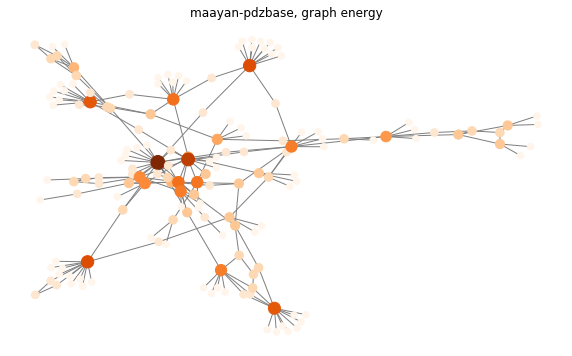

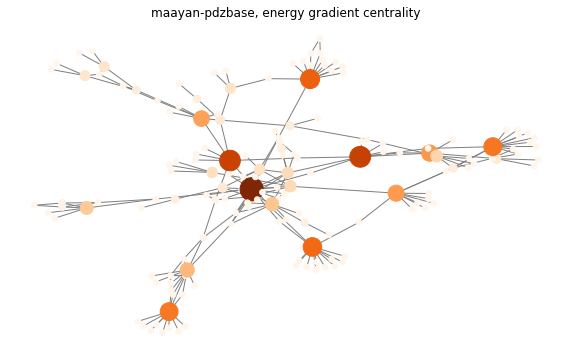

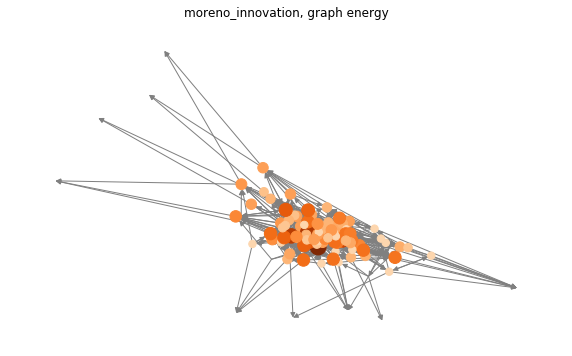

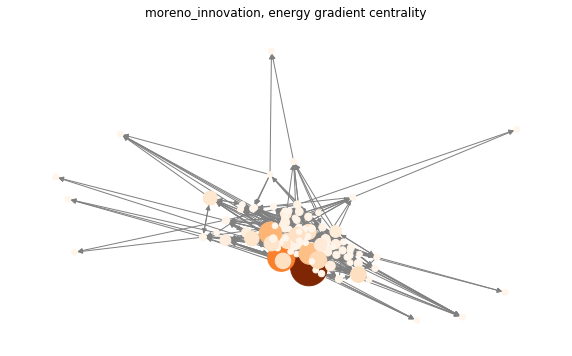

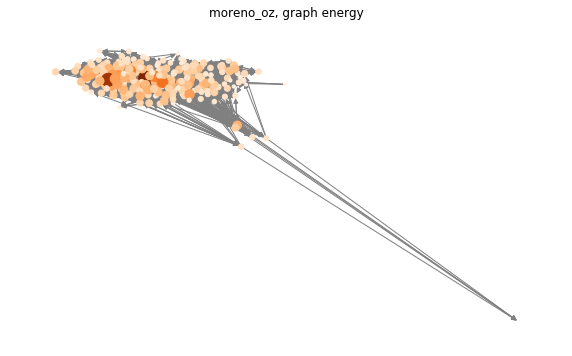

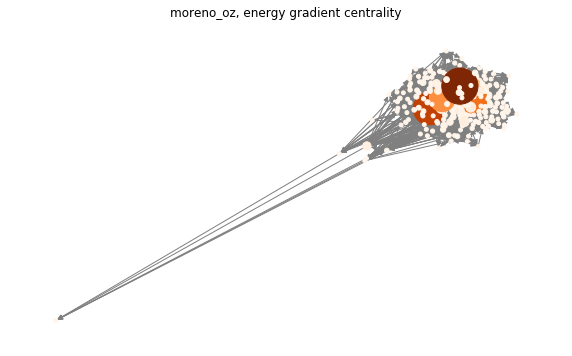

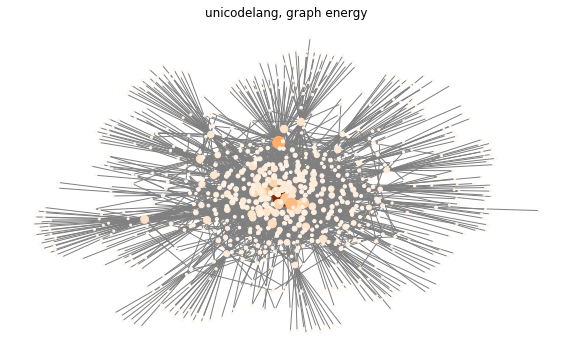

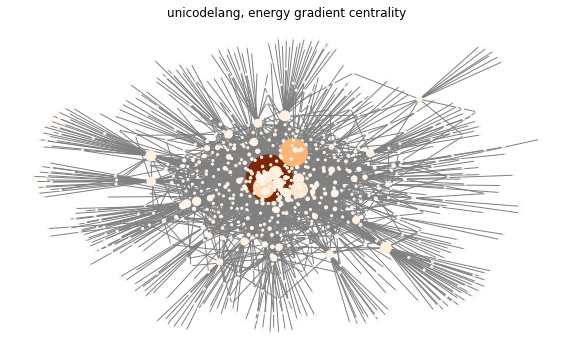

In [43]:
for _, (network_name, g) in tqdm(list(empirical_networks_df.loc[:, ['name', 'g']].iterrows())):
    display(HTML(f'<h2>{network_name}</h2>'))
    g.graph['name'] = network_name
    draw_graph(g, lambda g: utils.normalize_dict(calculate_graph_energy(g)), title_postfix=', graph energy')
    draw_graph(g, lambda g: utils.normalize_dict(calculate_graph_gradient_centrality(g)), title_postfix=', energy gradient centrality')
    
    dfs = []
    for repeat_no in tqdm(list(range(N_REPEATS))):
        results = run_network(g, BUDGET, ALLOCATIONS, NUM_ITERS)
        df = pd.DataFrame(list(map(lambda e: iteration_entry_to_dict(e, {'repeat_no': repeat_no}), results)))
        dfs.append(df)
    
    empirical_dfs.append(dfs)
    
        
# sns.set(rc={'figure.figsize':(11.7,8.27)})
# draw_inequalities(df)

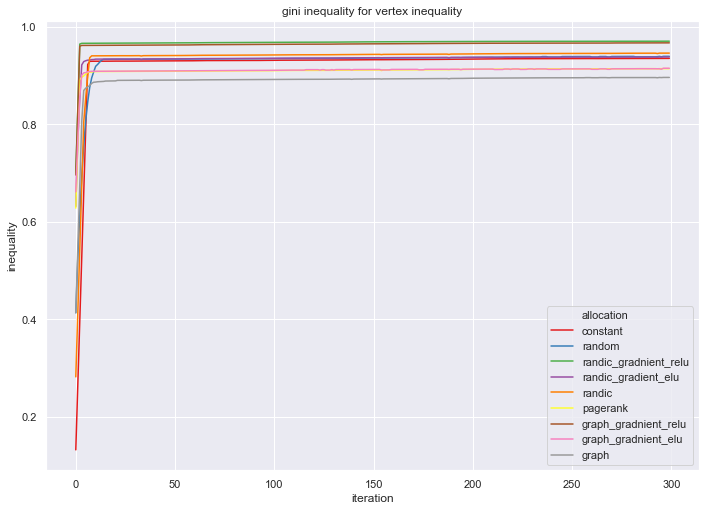

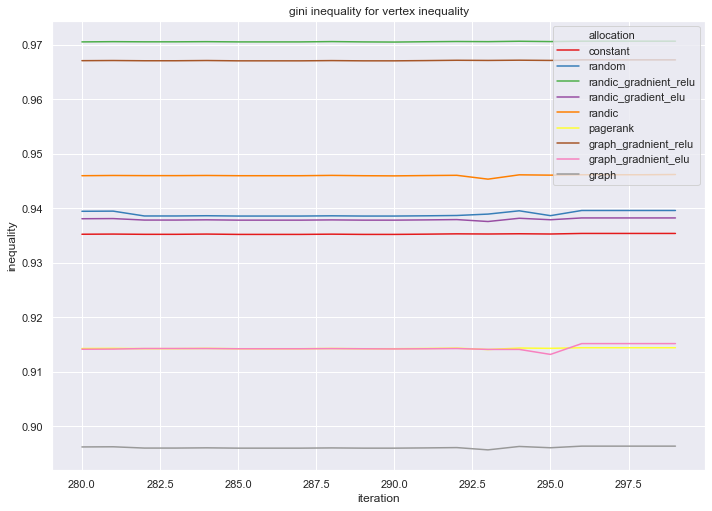

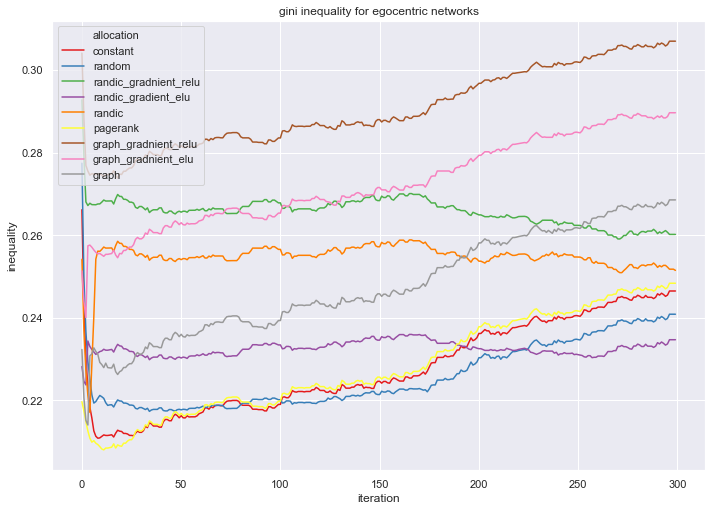

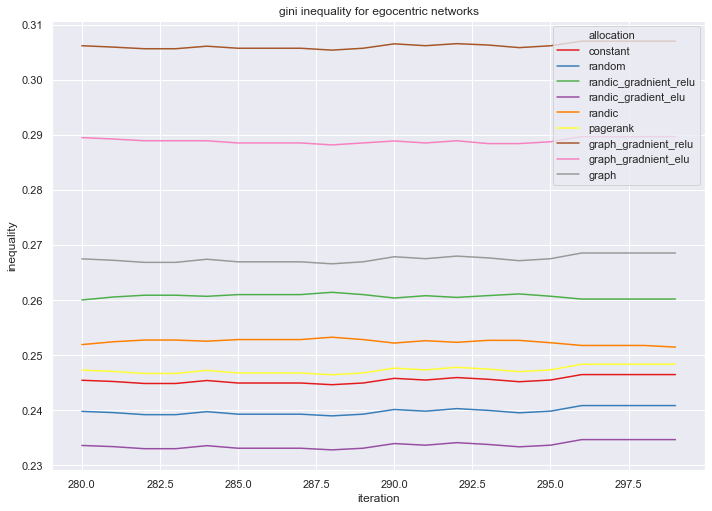

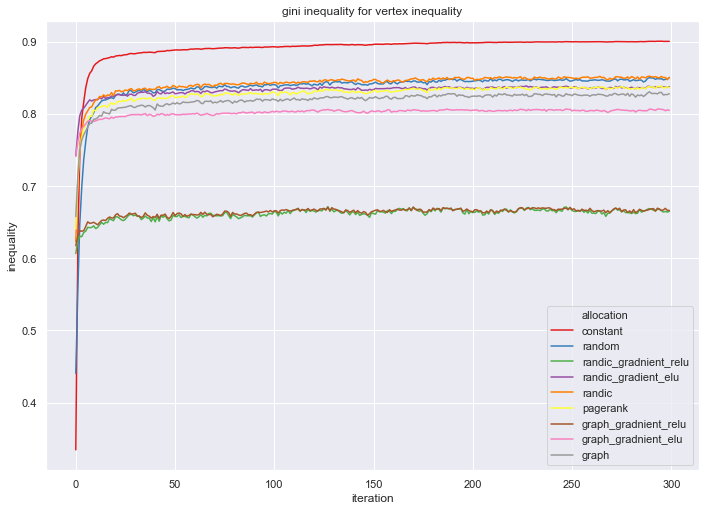

...

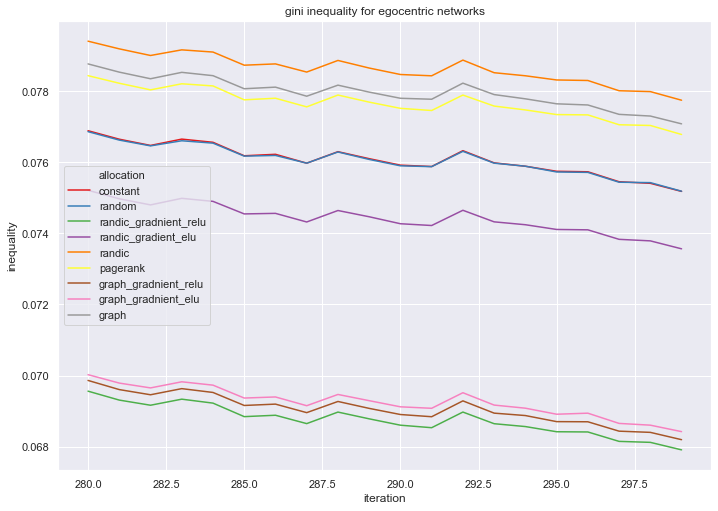

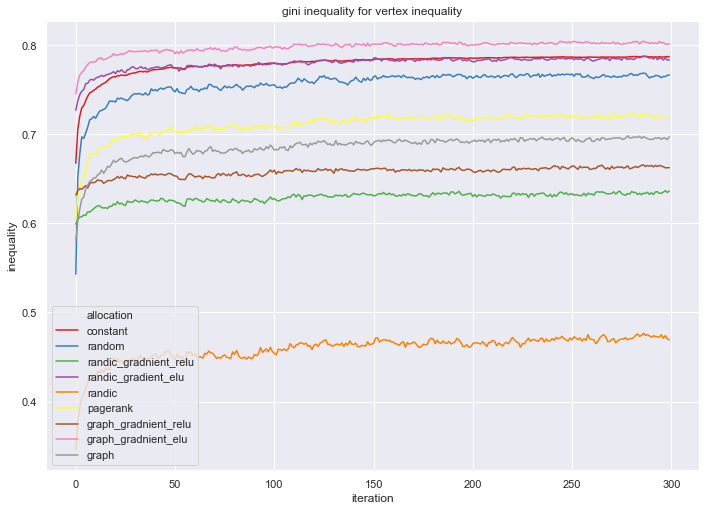

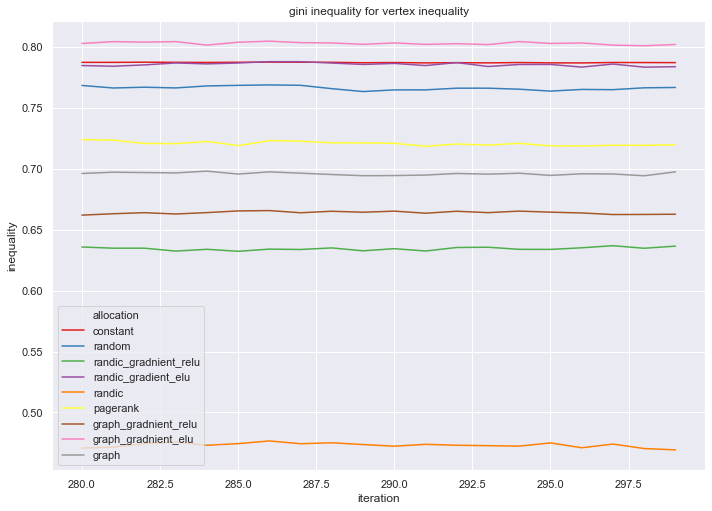

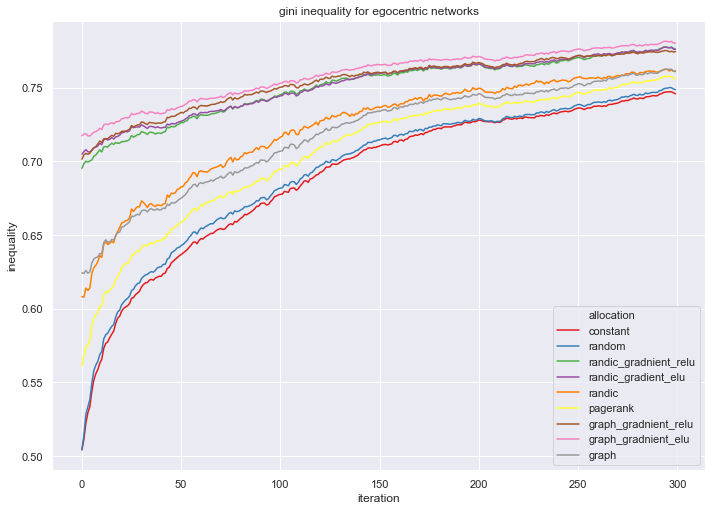

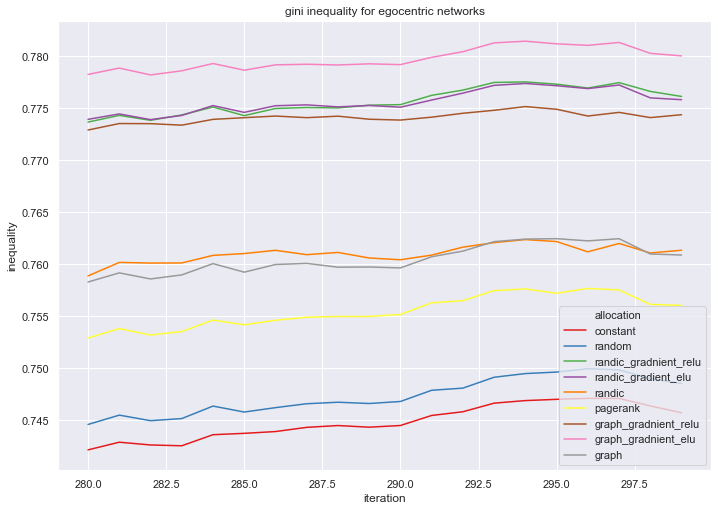

In [45]:
for dfs in empirical_dfs:
    df = pd.concat(dfs)
    df = df.query("allocation not in ['randic_pagerank', 'graph_pagerank', 'randic_gradnient_personalized', 'graph_gradnient_personalized']")
    avg_df = df.groupby(list(set(df.columns).difference(['repeat_no','inequality']))).mean()
    avg_df.reset_index(inplace=True)
    sns.set()
    sns.set(rc={'figure.figsize':(11.7,8.27)})    
    draw_inequalities(avg_df)

## Final minimal inequality

### Vertex distribution

In [121]:
empirical_df = pd.concat(itertools.chain.from_iterable(empirical_dfs))

In [122]:
empirical_df = empirical_df.query(f"allocation not in ['graph_gradnient_personalized', 'randic_gradnient_personalized']")

In [125]:
empirical_avg_df = empirical_df.groupby(list(set(empirical_df.columns).difference(['repeat_no', 'inequality']))).mean()
empirical_avg_df.reset_index(inplace=True)

In [126]:
get_min_inequlity_method(empirical_avg_df, 'vertex_distribution')

,inequality_level,allocation,network,iteration,inequality,repeat_no
99299,vertex_distribution,constant,adjnoun_adjacency,299,0.868143,0
126599,vertex_distribution,graph_gradnient_relu,brunson_club-membership,299,0.817645,0
171899,vertex_distribution,randic_gradnient_relu,brunson_corporate-leadership,299,0.683017,0
109199,vertex_distribution,graph,brunson_revolution,299,0.896334,0
100499,vertex_distribution,constant,brunson_south-africa,299,0.541000,0
100799,vertex_distribution,constant,brunson_southern-women,299,0.294800,0
191099,vertex_distribution,random,contiguous-usa,299,0.728854,0
110399,vertex_distribution,graph,dolphins,299,0.800348,0
191699,vertex_distribution,random,moreno_beach,299,0.796083,0
101999,vertex_distribution,constant,moreno_bison,299,0.568385,0


### Egocentric distribution

In [127]:
get_min_inequlity_method(empirical_avg_df, 'egonet_distribution')

,inequality_level,allocation,network,iteration,inequality,repeat_no
299,egonet_distribution,constant,adjnoun_adjacency,299,0.498606,0
72599,egonet_distribution,randic_gradnient_relu,brunson_club-membership,299,0.149701,0
899,egonet_distribution,constant,brunson_corporate-leadership,299,0.251656,0
73199,egonet_distribution,randic_gradnient_relu,brunson_revolution,299,0.220529,0
28499,egonet_distribution,graph_gradnient_relu,brunson_south-africa,299,0.134815,0
91799,egonet_distribution,random,brunson_southern-women,299,0.032569,0
92099,egonet_distribution,random,contiguous-usa,299,0.348516,0
2399,egonet_distribution,constant,dolphins,299,0.413460,0
65699,egonet_distribution,randic_gradient_elu,moreno_beach,299,0.186093,0
65999,egonet_distribution,randic_gradient_elu,moreno_bison,299,0.057668,0


In [128]:
avg_roc_df = group_and_calculate_avg_roc_and_variance(empirical_avg_df)

## Rate of Change 

### Vertex distribution

Intrestingly, we can see that gradient alocation methods often have the lowest average rate of change of inequality over iterations

In [129]:
get_min_statistic_method(avg_roc_df, 'avg_roc', 'vertex_distribution')

,,,,avg_roc
network,allocation,inequality_level,,
adjnoun_adjacency,graph_gradnient_elu,vertex_distribution,0,0.001249
brunson_club-membership,graph_gradnient_relu,vertex_distribution,0,0.001217
brunson_corporate-leadership,random,vertex_distribution,0,0.000851
brunson_revolution,randic_pagerank,vertex_distribution,0,0.000893
brunson_south-africa,graph_gradnient_relu,vertex_distribution,0,0.000740
brunson_southern-women,graph_gradnient_relu,vertex_distribution,0,0.000467
contiguous-usa,random,vertex_distribution,0,0.001236
dolphins,randic_gradnient_relu,vertex_distribution,0,0.001319
moreno_beach,graph_gradnient_relu,vertex_distribution,0,0.001272


### Egocentric distribution

In [130]:
get_min_statistic_method(avg_roc_df, 'avg_roc', 'egonet_distribution')

,,,,avg_roc
network,allocation,inequality_level,,
adjnoun_adjacency,randic_gradient_elu,egonet_distribution,0,0.000246
brunson_club-membership,graph_gradnient_relu,egonet_distribution,0,-0.000340
brunson_corporate-leadership,random,egonet_distribution,0,0.000103
brunson_revolution,randic_gradnient_relu,egonet_distribution,0,-0.000172
brunson_south-africa,random,egonet_distribution,0,-0.000127
brunson_southern-women,constant,egonet_distribution,0,-0.000129
contiguous-usa,graph_gradnient_relu,egonet_distribution,0,0.000476
dolphins,randic_gradnient_relu,egonet_distribution,0,0.000232
moreno_beach,graph_gradnient_relu,egonet_distribution,0,-0.000236


## Variance

### Vertex distribution

Intrestingly, we can see that gradient methods often have the lowest variance of inequality over iterations

In [131]:
get_min_statistic_method(avg_roc_df, 'variance', 'vertex_distribution')

,,,,variance
network,allocation,inequality_level,,
adjnoun_adjacency,randic_gradient_elu,vertex_distribution,0,0.003522
brunson_club-membership,graph_gradnient_relu,vertex_distribution,0,0.009284
brunson_corporate-leadership,random,vertex_distribution,0,0.006791
brunson_revolution,randic_pagerank,vertex_distribution,0,0.000322
brunson_south-africa,graph_gradnient_relu,vertex_distribution,0,0.003877
brunson_southern-women,graph_gradnient_relu,vertex_distribution,0,0.001450
contiguous-usa,randic_gradnient_relu,vertex_distribution,0,0.010445
dolphins,graph_gradnient_elu,vertex_distribution,0,0.007186
moreno_beach,graph,vertex_distribution,0,0.010288


### Egocentric distribution

In [132]:
get_min_statistic_method(avg_roc_df, 'variance', 'egonet_distribution')

,,,,variance
network,allocation,inequality_level,,
adjnoun_adjacency,randic_gradient_elu,egonet_distribution,0,0.000363
brunson_club-membership,graph_pagerank,egonet_distribution,0,0.000038
brunson_corporate-leadership,randic_gradnient_relu,egonet_distribution,0,0.000140
brunson_revolution,randic_pagerank,egonet_distribution,0,0.000008
brunson_south-africa,graph_gradnient_relu,egonet_distribution,0,0.000008
brunson_southern-women,random,egonet_distribution,0,0.000052
contiguous-usa,graph_gradnient_relu,egonet_distribution,0,0.001749
dolphins,randic_gradnient_relu,egonet_distribution,0,0.000430
moreno_beach,randic,egonet_distribution,0,0.000053


In [22]:
from ipyparallel import Client

rc = Client()
view = rc.load_balanced_view()

def foo(param):
    import time
    time.sleep(10)
    return param*2

parameters = list(range(4))
async_results = []
for p in parameters:
    async_result = view.apply_async(foo, p)
    async_results.append(async_result)
    
rc.wait_interactive(async_results)
    
results = [ar.get() for ar in async_results]
print(results)

   4/4 tasks finished after   10 s
done
[0, 2, 4, 6]
